### 💻 Verify GPU Configuration (Activate GPU for faster execution)


In [ ]:
# uncomment to verify
# from google.colab import output
# import torch

# if not torch.cuda.is_available():
#     from IPython.display import display, Markdown
#     display(Markdown("## ❌ **ERROR : GPU is not detected**"))
#     display(Markdown("Go to **Runtime > Change runtime type** and selection **T4 GPU**."))

#     output.eval_js('alert("Missing GPU !")')
#     raise SystemError("The GPU must be activated to continue.")
# else:
#     print("✅ GPU détecté :", torch.cuda.get_device_name(0))

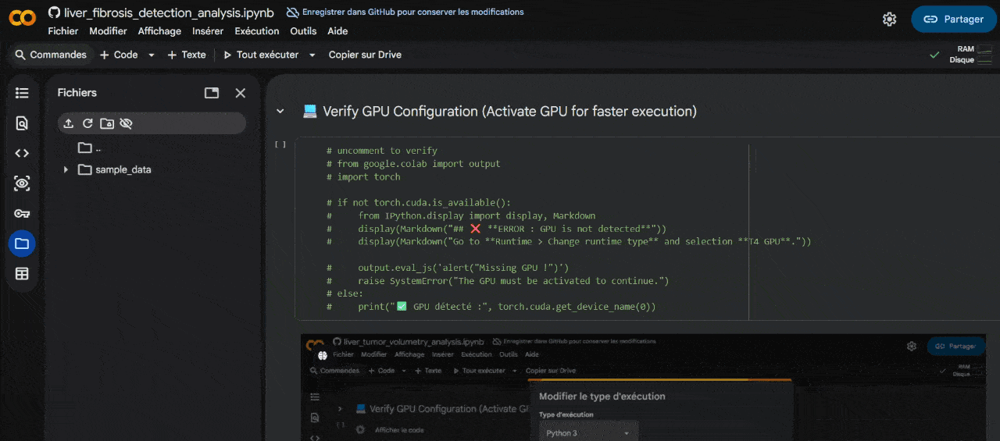

### 🛠️ 1. Setup Environment (restart the session after installation)

In [ ]:
!git clone https://github.com/Oumar199/LiverFibrosisDetection.git
!pip install -e LiverFibrosisDetection/liver-fibrosis-detection -qqq


print("\n✅ Environment ready.")

In [ ]:
print("Runtime will restart ! Continue executing other cells.")

import os
os.kill(os.getpid(), 9)

### 📂 2. Data Preparation

#### Load an image

Choose an option:
1. Use default sample image
2. Upload your own image


Enter 1 or 2:  1


✅ Using default sample.


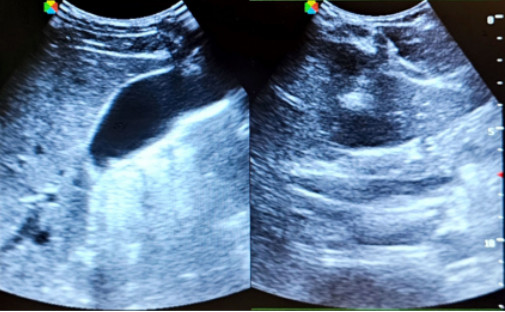

In [1]:
# from google.colab import files
from IPython.display import Image, display
import os

print("Choose an option:")
print("1. Use default sample image")
print("2. Upload your own image")

choice = input("Enter 1 or 2: ")

IMAGE_PATH = "/content/LiverFibrosisDetection/images/sample_image.png"

if choice == "2":
    uploaded = files.upload()
    if uploaded:
        filename = list(uploaded.keys())[0]
        IMAGE_PATH = os.path.join("images", filename)
        print(f"✅ Uploaded: {filename}")
else:
    if not os.path.exists(IMAGE_PATH):
        !wget -O {IMAGE_PATH} https://github.com/Oumar199/LiverFibrosisDetection/blob/main/images/sample_image.png?raw=true
    print("✅ Using default sample.")

display(Image(IMAGE_PATH, width=400))

#### Patient data

Below an example of necessary values to provide:
- Age (years): `55`
- Sex (M/F): `F`
- BMI (kg/m²): `28`

--- Vital Signs (Enter = normal value) ---
- Heart rate (bpm): `83`
- Temperature (°C): `37`
- Blood pressure (ex: 120/80): `12`

Write
```python
collect_patient_data(necessary_only=False)
```
if you want to provide more clinical values.

In [3]:
from liver_fibrosis_detection.utils.data_preparation import collect_patient_data

# seize patient data
patient_data = collect_patient_data(necessary_only=True)


📋 PATIENT DATA ENTRY


  Age (years):  55
  Sex (M/F):  F
  BMI (kg/m²):  28



--- Vital Signs (Enter = normal value) ---


  Heart rate (bpm):  83
  Temperature (°C):  37
  Blood pressure (ex: 120/80):  12



--- Symptoms (y/N) ---
  

--- Advanced Clinical Signs (y/N) ---
  Collateral circulation: N
  Hippocratic fingers: N
  Consciousness disorder: N
  Collateral circulation: N
  Encephalopatic Stage: 0.0

--- Risk Factors ---
  Hepatitis B (HBV): 0.0


### 🔐 3.1 Ensure you are authorized to use the Gemma-1.1-2b-it model (see below)

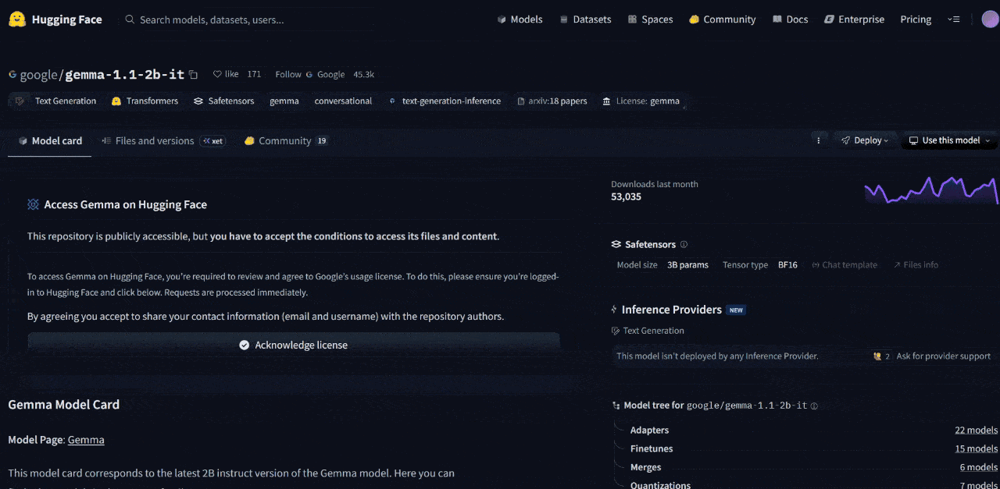

Find the model in [huggingface](https://huggingface.co/google/gemma-1.1-2b-it).

### 🔐 5.2 Log into you huggingface account

In [4]:
from huggingface_hub import login

login()

### 🚀 4. Run Local AI Analysis with Gemma

🔧 Loading MedGemma 1.5-4B-it...


config.json:   0%|          | 0.00/2.55k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/35.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/662 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/1.53k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/115 [00:00<?, ?B/s]

✅ FibroDetect V4.1 + MedGemma prêt


🔬 ANALYSIS IN PROGRESS...

1️⃣ Loading V4.1 model...
   ✅ Model loaded

2️⃣ Data preprocessing...
   ✅ Data ready

3️⃣ AI inference...
   ✅ Fibrosis score: 28.5%
   ✅ Prediction: FAVORABLE PROFILE

4️⃣ Generating visualizations...
   ⚠️ Heatmap not available


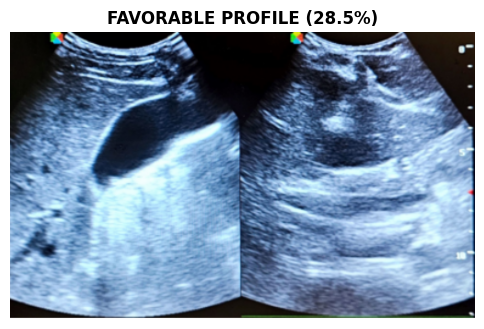


5️⃣ Generating medical report...

📝 MEDICAL REPORT GENERATION (MedGemma 2B)

──────────────────────────────────────────────────────────────────────
**S (SUBJECTIVE):**
Patient is a 55-year-old female with a BMI of 28.0 kg/m². She has identifiable risk factors including being overweight and having an age greater than 50 years. There are no reported overt clinical signs noted during this encounter.

**O (OBJECTIVE):**
An AI model analysis was performed using liver ultrasound and 21 clinical variables.
AI SCORE: 28.5%.
Interpretation: Very favorable profile.
Probable Stage Estimation: F0 (normal parenchyma).
Model Performance Details: Recall = 61%, Precision = 27%.

**A (ASSESSMENT):**
Based on the AI model output, the patient presents with a very favorable profile suggestive of probable F0 (normal parenchyma). This falls within the range where standard annual surveillance is typically recommended. However, it is important to consider the limitations of the AI model, specifically its ina

In [8]:
from transformers import pipeline, AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig
from liver_fibrosis_detection.inference.fibrosis_analysis import run_full_analysis
# from google.colab import userdata, files
from transformers import pipeline
import transformers
import torch

transformers.logging.set_verbosity_error()

# Configure model and scaler paths
MODEL_PATH = '/content/LiverFibrosisDetection/data/fibro_model_v4_1_balanced.pth'
SCALER_PATH = '/content/LiverFibrosisDetection/data/scaler_params_final.json'

# ───────────────────────────────────────────────────────────────────
# Load analysis model
# ───────────────────────────────────────────────────────────────────
print("🔧 Loading MedGemma 1.5-4B-it...")

try:
    model_name = "google/medgemma-1.5-4b-it"

    tokenizer = AutoTokenizer.from_pretrained(model_name)

    quantization_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_compute_dtype=torch.float16,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_use_double_quant=True,
    )

    llm = pipeline(
        "text-generation",
        model=model_name,
        tokenizer=tokenizer,
        device_map="auto",
        model_kwargs={"quantization_config": quantization_config}
    )
    print("✅ FibroDetect V4.1 + MedGemma prêt\n")
except Exception as e:
    llm = None
    print(f"⚠️ MedGemma is not available: {e}")
    print(" LLM is excluded!\n")

# ───────────────────────────────────────────────────────────────────
# Analysis
# ───────────────────────────────────────────────────────────────────
run_full_analysis(
    model_path=MODEL_PATH,
    scaler_path=SCALER_PATH,
    img_path=IMAGE_PATH,
    patient_data=patient_data,
    llm=llm
)

print("\n" + "="*70)
print("✅ ANALYSIS IS SUCCESSFUL")
print("="*70)
